# Introduction to Assignment and Topic

**Course:** Social Data Analysis

**Group members:** Mads Fugl Petersen, Zineb Fadili, Miriam Peinado

<br/>

In this exam assignment in Social Data Analysis at DTU, we have elected to explore the topic of gentrification in New York City. 

Specifically, we are posing the question: "Is New York City Undergoing Gentrification?"


<br/>

**LINK TO THE WEBSITE:** http://nycgentrification.pythonanywhere.com/

<br/>

**IMPORTANT NOTE:**

The interactivity with the maps on the website is done through Dash, where there are sliders to select criteria such as years, types of housing, borough, neighborhood and more. The methods in this notebook are called each time in order to create a new map, whereas, every time the methods are called on the website, they instead save an html version of the maps according to the input of the user, which the Dash app then retrieves and loads.

As Dash is not available on this notebook, we will show only one example of a map created for a certain selection of values.



# 1. Motivation

With the question "Is New York City Undergoing Gentrification?" as our point of departure, we first sough to decide on what factors might best expose ongoing gentrification. 

Because gentrification is characterized, in particular, by more expensive housing being built, incresingly wealthier people moving in, and current inhabitants being displaced, we eventually settled on the following factors:
- Area specific average incomes
- New housing projects
- Demographic/ethnic changes
- Crime rates

## What are our datasets?

Our **income data** comes from the U.S. Census Bureau's 'American Community Survey 1-Year Estimates, Summary Table B19001 (2005-2019)' (website: https://data.census.gov/). The data we use is a subset that covers the inflation adjusted average incomes of New York City households by different levels of granularity, from zip codes, to districts, boroughs and the city as a whole. The household types for which average incomes are available include the categories 'All Households', 'Families', 'Families with Children' and 'Families witout Children'.

The **housing data** comes New York City's open data, 'Housing New York Units by Project' (website : https://data.cityofnewyork.us/Housing-Development/Housing-New-York-Units-by-Project/hq68-rnsi). This dataset provides a record of all housing projects started from 2014 in NYC and indicators on their location (both borough and neighborhood) and the category of units built. It categorizes the housing units into the following groups : Extremely Low Income Units (households earning 0 to 30% of the area median income), Very Low Income Units(households earning 31 to 50% of the area median income), Low Income Units( households earning 51 to 80% of the area median income), Moderate Income Units (households earning 81 to 120% of the area median income), Middle Income Units (households earning 121 to 165% of the area median income)

The **homebase locations data** comes New York City's open data, 'Directory Of Homebase Locations' (website : https://data.cityofnewyork.us/Housing-Development/Housing-New-York-Units-by-Project/hq68-rnsi). This dataset provides a record the available homeless prevention offices throughout NYC and information about them, such as their coordinates that we will be using.

The **demographics/ethnicity data** comes from the U.S. Census Bureau's 'American Community Survey 5-Year Estimates, Table B03002 (2009-2019)'. We specifically select the data on the relative ethnic makeup at the level of borough and district, respectively, for the subset of the data convering New York City. The ethnic categories are 'Asian, 'Black', 'Latino', 'White' and 'Other', and the dataset covers both the absolute number as well as the percent of inhabitants by ethnic group.

The **crime data** comes from New York’s city Open Data: *'NYPD Arrests Data (Historic)'* (website: https://data.cityofnewyork.us/Public-Safety/NYPD-Arrests-Data-Historic-/8h9b-rp9u). This is a breakdown of every arrest effected in NYC by the NYPD between 2006 and 2019. We harmonized the data to fit the previous visualizations by filtering between the years 2014 and 2019. In this dataset each row corresponds to a crime arrest effected. The columns relevant and therefore selected to work with were the date of arrest from which we only kept year information, the borough of arrest. B(Bronx), S(Staten Island), K(Brooklyn), M(Manhattan), Q(Queens), the precinct where the arrest occurred, both latitude and longitude information to plot on the maps and the description of the crime committed. Among 82 different crime description categories we focused on 'dangerous drugs', 'assault 3 & related offenses', 'dangerous weapons', 'robbery', 'criminal mischief & related offenses', 'grand larceny', 'burglary', 'sex crimes', 'disorderly conduct', 'offenses involving fraud' and 'under the influence, drugs'.

An analysis centered around data for New York City naturally lends itself to using choropleth maps. As such, we have also collected a number of **.geojson files** that we use to plot the boundaries of New York City's boroughs and districts on a number of choropleth maps, which is made possible by creating a link between sets of corresponding area codes (called 'Fips' codes) that feature in both the .geojson and .csv files. The geojson file were taken from NYC's webiste (https://www1.nyc.gov/site/planning/data-maps/open-data/districts-download-metadata.page)


## Why did we choose these particular datasets?

First and foremost, it was paramount to us that all of our datasets came from reputable sources (namely, https://opendata.cityofnewyork.us/ and https://data.census.gov/). 

Second, because our analysis required that we examine changes over time, we tried our best to locate datasets that covered the same interval of years. 

Finally, we wanted our datasets to contain a minimal amount of missing data.

## What was our goal for the end user's experience?

Our two primary goals for the end user's experience was:

1) **To help the user better understand both the concept of gentrification as well as to what degree it has affected New York City.** To this end, we have attempted to create a clearly structured narrative that addresses our question on the basis of the visualized data.

2) **To enable the user to interact with the visualizations.** The ability to interact, in and of itself, is *fun*, but in addition to this, different users might also be particularly interested in different elements of a visualization, such as data pertaining to their own ethnicity, or the area in which they themselves live. By adding in filters for categories and years, the individual user is able to zero in on the things that are most relevant to them.

# 2. Basic stats


## Our choices in data cleaning and preprocessing:

Because our datasets come from a number of different sources, the steps we take to clean and preprocess the datasets also differ slightly. However, what is common for all datasets is that they are downloaded as .csv files and loaded into this notebook as DataFrames. The shapefiles used to plot the maps are downloaded and used as json files.

In order to detect issues with the dataset, we have done a preliminary analysis (not shown here) in order to find null or missing values. Once we were able to pinpoint what lacked in each dataset we decided on solutions.

When faced with missing values, we have decided to either impute the missing values (as an average between the prior and posterior data points), and to remove those that weren't central to our analysis and hardly extrapolated.

Another issue we encountered was one of needing to homogenize the dataset types, as some of these had to be formatted upon being loaded in such a way that all columns were transformed into Object-types. In so doing, we proceeded to transform all column values into a string, integer or float format.

Furthermore, our different plots required that the datasets be split and transformed in a variety of ways. For example, in order to create choropleth maps with drop-down menu options for what data to display and how to display it, some columns had to be split by category into multiple columns or multiple datasets.

For each dataset we have use different techniques have been adopted, and are explained below.



### Imports and installations

In [ ]:
# Mounting the drive
from google.colab import drive
drive.mount('/content/drive', force_remount = True)

Mounted at /content/drive


In [ ]:
# Upgrading folium for the heatmap
!pip install folium --upgrade

Requirement already up-to-date: folium in /usr/local/lib/python3.7/dist-packages (0.12.1)


In [ ]:
# Imports
import pandas as pd
import numpy as np
import math

import json

import urllib
from urllib.request import urlopen

from IPython.display import YouTubeVideo

import folium
from folium import plugins
from folium.plugins import HeatMap

import plotly.graph_objects as go

from bokeh.io import output_notebook, show, output_file
from bokeh.plotting import figure, save
from bokeh.models import GeoJSONDataSource, LinearColorMapper, ColorBar, NumeralTickFormatter
from bokeh.palettes import brewer

from bokeh.io.doc import curdoc
from bokeh.models import Slider, HoverTool, Select
from bokeh.layouts import widgetbox, row, column

from bokeh.io import output_file, output_notebook
from bokeh.models import ColumnDataSource, FactorRange, Legend
from bokeh.palettes import Category20b
from bokeh.plotting import figure, show
import plotly.express as px

### Cleaning an preprocessing the income dataset

#### Loading the data

In [ ]:
# Loads the income dataset.
incomes_path = '/content/drive/MyDrive/socialdata2021/Final project/Code/datasets/Median Incomes.csv'
income_data = pd.read_csv(incomes_path, sep=',')

#### Preparing the data for the initial plot

The points of focus when it comes to cleaning and preprocessing the income dataset is the need the make sure that we deal with numerical values as we are looking at amounts of money.

As there is no way for us to infer an income, we have decided to drop entries that inadequate (i.e non-numerical) values and convert the remaining as float types.

For our confort, we choose to rename some columns in order to make more explicit what they are referring to (and to harmonize them with their calling in the shapefiles, see next section)

In [ ]:
# Removes missing data from 'Data' colum and converts data type from 'str' to 'float'.
income_data = income_data[~income_data.Data.str.contains('#VALUE!')]
income_data['Data'] = income_data['Data'].astype(float).astype(int)

# Drops the 'DataFormat' column.
income_data = income_data.drop(columns='DataFormat')

# Changes column names to be more precise.
income_data = income_data.rename(columns={'Location': 'BoroName',
                                          'TimeFrame': 'Year',
                                          'Data': 'Annual Income (USD)', 
                                          'Fips': 'BoroCD'})

Furthermore, our goal is to plot a distribution that puts in evidence to evolution of the income for all households since 2014 for each borough. Therefore, we need to limit our input data to only take into account all households and discard the other nuances.

Also, this plot serves as introduction and aims at giving a wide view of the evolution of NYC, therefore, for this plot we will be keeping entries from 2015.

The USA defines Fips Codes for boroughs and districts. In the documentation it is indicated that boroughs have Fips Codes that are between 30 thousand and 100 thousand, and these are the ones we keep.

In [ ]:
# Formatting the dataset
income_all_households = income_data.loc[income_data['Household Type'] == 'All Households']
income_all_households = income_all_households.rename(columns={'Annual Income (USD)': 'Annual Income (USD), All Households'})
income_all_households = income_all_households.drop(columns='Household Type')

# Keeping only the boroughs
income_by_borough = income_all_households[~(income_all_households['BoroCD'] < 30000)]
income_by_borough = income_by_borough[~(income_by_borough['BoroCD'] > 100000)]

#### Further data preparation to plot maps

As we are going to plot the geographical distribution of income throughout NYC, we will need not only the dataset about the income by district and boroughs, we also necessite shapefiles for the districts and the boroughs.

Here again, the main focus is to assure ourselves that we are using numerical values as we are dealing with money. Also, as we will be plotting a choropleth map, we need to make sure of the concordance between the shapefiles and the data. This has actually proven to be one of the biggest challenges, as there were some districts lacking in the shapefiles and vice-versa.

What we have decided to do, is to limit ourselves to the districts of which the dataset provides us with information on income and abandon others, not only because it would be tricky to extrapolate, but also because there are so few of them (around 10) that they prove to be inconsequential.

**1. First we need to load the shapefiles**

In [ ]:
# Shapefile for districts
districts_shapefile_path = '/content/drive/MyDrive/socialdata2021/Final project/Code/datasets/district_codes.json'
with open(districts_shapefile_path) as json_file:
    districts_geodata = json.load(json_file)

# Shapefile for boroughs
boroughs_shapefile_path = '/content/drive/MyDrive/socialdata2021/Final project/Code/datasets/shapefile_borough.json'
with open(boroughs_shapefile_path) as json_file:
    boroughs_geodata = json.load(json_file)

We also need to restrict the data from 2014 to 2019 (and it already stops at 2019)

In [ ]:
# Keeping data only from 2014
income_data=income_data[income_data['Year']>2013]

Then we need to reshape the data in a way that accomodates our plotting.

We want to geographically plot the evolution of income throughout the years for different types of households in different boroughs/districts in a choropleth maps.
Thus, the type of households become our columns for which we will have values for every district/borough and for each year from 2014 to 2019

In [ ]:
# Formatting
income_all_households = income_data.loc[income_data['Household Type'] == 'All Households']
income_all_households = income_all_households.rename(columns={'Annual Income (USD)': 'All Households'})
income_all_households = income_all_households.drop(columns='Household Type')

income_families = income_data.loc[income_data['Household Type'] == 'Families']
income_families = income_families.rename(columns={'Annual Income (USD)': 'Families'})
income_families = income_families.drop(columns='Household Type')

income_families_with_children = income_data.loc[income_data['Household Type'] == 'Families with Children']
income_families_with_children = income_families_with_children.rename(columns={'Annual Income (USD)': 'Families with Children'})
income_families_with_children = income_families_with_children.drop(columns='Household Type')

income_families_without_children = income_data.loc[income_data['Household Type'] == 'Families without Children']
income_families_without_children = income_families_without_children.rename(columns={'Annual Income (USD)': 'Families without Children'})
income_families_without_children = income_families_without_children.drop(columns='Household Type')

tmp1 = pd.merge(income_all_households, income_families, on=('BoroName', 'Year', 'BoroCD'), how='inner')
tmp2 = pd.merge(income_families_with_children, income_families_without_children, on=('BoroName', 'Year', 'BoroCD'), how='inner')
income_data = pd.merge(tmp1, tmp2, on=('BoroName', 'Year', 'BoroCD'), how='inner')

In this dataset we fall into an important problem : there are missing borough/district codes in the dataset. As we do not have any information on those regions in our income dataset, we choose to simply remove them from our dataset. They are, either way, by their very small number inconsequential on the sense we are giving our plots.

In [ ]:
existing_districts = income_data['BoroCD'].unique()
# Removing districts in the gson that we don't have data for
to_be_removed = []
i=0
for f in districts_geodata['features']:
  if not np.isin(f['properties']['BoroCD'], existing_districts):
    to_be_removed.append(i)
  i+=1
districts_geodata['features'] = [i for j, i in enumerate(districts_geodata['features']) if j not in to_be_removed]

We notice another issue with our dataset : some codes existing in it, have missing values for some years. We choose to extrapolate those value by doing the average between the year before and the year after the one missing. The reason behind this choice, is there are many codes that miss 1 year, and it wouldn't be responsible to throw away that much data. Furthermore, there is no real sharp increase throughout the years, thus it is reasonable to assume that an average is an acceptable approximation.

In [ ]:
years = np.arange(2014, 2020, 1)
# Inserting rows for the missing years
for f in districts_geodata['features']:
  code = f['properties']['BoroCD']
  for year in years:
    ic = income_data[income_data['BoroCD']==code]
    if ic[ic['Year']==year].empty:
      year_before = ic[ic['Year']==year-1]
      year_after = ic[ic['Year']==year+1]
      new_row = {'BoroName': year_before['BoroName'].values[0], 'Year' : year, 
                 'All Households' : int((year_before['All Households'].values[0]+year_after['All Households'].values[0])/2),
                 'BoroCD' : code,
                 'Families' : int((year_before['Families'].values[0]+year_after['Families'].values[0])/2),
                 'Families with Children' : int((year_before['Families with Children'].values[0]+year_after['Families with Children'].values[0])/2),
                 'Families without Children' : int((year_before['Families without Children'].values[0]+year_after['Families without Children'].values[0])/2)}
      income_data = income_data.append(new_row, ignore_index=True)

Finally, we want to be able to provide additional information to the user when they hover over the map. In folium maps this is done through the GeoJsonToolTip, and it necessits for the information to be added to the shapefile. This is why, for both districts and neighborhoods, we introduce into the shapefile new keys regarding income per year.

In [ ]:
# We create a dictionary to hold all of our values

# Household types
house_types = ['All Households', 'Families', 'Families with Children', 'Families without Children']
# Dictionary contains the formatting for the data in the plots
ranges_house_income = [('All Households', 0, 300000),
               ('Families', 0, 300000),
               ('Families with Children', 0, 300000),
               ('Families without Children', 0, 300000)]

# A DataFrame object from the dictionary
ranges_house_income = pd.DataFrame(ranges_house_income, columns=[
                         'family_type', 'min_range', 'max_range'])

# Adding data for popups for boroughs
years = np.arange(2014, 2020, 1)

for f in boroughs_geodata['features']:
    for htype in ranges_house_income['family_type']:
        Dict = {}
        for year in years:

            bname = f['properties']['BoroName']

            data = income_data[income_data['Year'] == year]

            data = data[data['BoroName'] == bname]
            fieldname = htype+'_'+str(year)
            f['properties'][fieldname] = int(data[htype].values[0])

In [ ]:
# Adding data for popups for districts
for f in districts_geodata['features']:
    for htype in ranges_house_income['family_type']:
        for year in years:

            dname = f['properties']['BoroCD']

            data = income_data[income_data['Year'] == year]

            data = data[data['BoroCD'] == dname]

            fieldname = htype+'_'+str(year)
            value = data[htype].values[0]
            f['properties'][fieldname] = int(value)


### Cleaning and preprocessing the housing dataset

#### Loading the data

As we will be plotting maps in relation with the housing dataset we need to load both shapefiles for NYC's boroughs and neighborhoods and NYC's open data regarding housing projects.

Furthermore, as we are looking at housing, we will also be exploring the situation of the homeless and the link between the housing prices and the level of homelessness, thus we also load a dataset giving the homebase locations throughout NYC.

In [ ]:
# Loading the shapefiles

# Path for the shapefile by borough
shapefile_borough = '/content/drive/MyDrive/socialdata2021/Final project/Code/datasets/shapefile_borough.json'

# Opening json file
with open(shapefile_borough) as json_file:
    borough = json.load(json_file)

# Path for shapefile for the neighborhoods
shapefile_path = '/content/drive/MyDrive/socialdata2021/Final project/Code/datasets/shapefile-nyc.json'

# Opening json file
with open(shapefile_path) as json_file:
    neighb = json.load(json_file)

# We store the neighborhood codes
ntacodes = []
for i in range(neighb['totalFeatures']):
    ntacodes.append([neighb['features'][i]['properties']['ntacode'],
                     neighb['features'][i]['properties']['boroname']])

In [ ]:
# Path for the housing data
housing_path = '/content/drive/MyDrive/socialdata2021/Final project/Code/datasets/housing-nyc.csv'
  # Explanation of the different types of income units
    # Extremely Low Income Units (households earning 0 to 30% of the area median income)
    # Very Low Income Units(households earning 31 to 50% of the area median income) 
    # Low Income Units( households earning 51 to 80% of the area median income) 
    # Moderate Income Units (households earning 81 to 120% of the area median income) 
    # Middle Income Units (households earning 121 to 165% of the area median income)
housing = pd.read_csv(housing_path)

In [ ]:
# Path for the homebase locations
homeless_path = '/content/drive/MyDrive/socialdata2021/Final project/Code/datasets/homeless-centers-nyc.csv'
home = pd.read_csv(homeless_path)

#### Preparing the datasets

**1. Preparation of the housing dataset**


As we will be plotting the evolution of the number of the different types of income units throughout the years, our main focus is to avoid lacking information.

We notice that some years have no entries in the housing dataset. We have decided not to extrapolate those values and set them to 0 instead: there is too much of a fluctuation between the years for many of the entries, therefore doing an average between the year before and after doesn't seem coherent.

As we are, throughout the project studying the gentrification of NYC from 2014 to 2019, we only keep entries for those years.

We also group the data according to what we are plotting: we group by year, borough and neighborhood and sum over the different types of income units.

In [ ]:
# List of different housing types
housing_types = ['Extremely Low Income Units', 'Very Low Income Units',
                 'Low Income Units', 'Moderate Income Units', 'Middle Income Units']

# Only keeping the columns of the dataset we want
housing_columns = housing_types + \
    ['Project Start Date', 'NTA - Neighborhood Tabulation Area', 'Borough']

# Renaming the column to make them easier to manipulate
housing_data = housing[housing_columns].rename(columns={'NTA - Neighborhood Tabulation Area': 'ntacode', 'Project Start Date': 'date',
                                                        'Extremely Low Income Units': 'extremely_low_income', 'Very Low Income Units': 'very_low_income',
                                                        'Low Income Units': 'low_income', 'Moderate Income Units': 'moderate_income',
                                                        'Middle Income Units': 'middle_income', 'Borough': 'borough'})

# As we will be plotting the housing types through the years, we create a column containing only that value, and removing the data column
# as we won't be using it
housing_data['date'] = pd.to_datetime(housing_data['date'])
housing_data['year'] = housing_data['date'].dt.year
# 
housing_data = housing_data.drop('date', axis=1).dropna()
housing_data= housing_data[housing_data['year']<2020]

# We will be plotting the number of different types of income units by borough through the year, so we group the dataset that way
housing_data = housing_data.groupby(['ntacode', 'year', 'borough']).agg({'extremely_low_income': 'sum',
                                                                         'very_low_income': 'sum',
                                                                         'low_income': 'sum',
                                                                         'moderate_income': 'sum',
                                                                         'middle_income': 'sum'}).reset_index()


As previously stated notice that there is some missing entries in the dataset: there are some neighborhoods missing, and for some of the neighborhoods, there are years where there's no information. To alleviate this, we create new rows, where we set the values for the different types of income units to 0, as this means that no project has been created with those criteria.

In [ ]:
# Inserting rows so we have info for every year for every neighborhoods (some have missing years), and some neighborhoods are missing too
for info in ntacodes:
    nta = info[0]
    for i in range(2014, 2020):
        if not (((housing_data['ntacode'] == nta) & (housing_data['year'] == i)).any()):
            row = {'extremely_low_income': 0,
                   'very_low_income': 0,
                   'low_income': 0,
                   'moderate_income': 0,
                   'middle_income': 0,
                   'ntacode': nta,
                   'year': i,
                   'borough': info[1]}

            housing_data = housing_data.append(row, ignore_index=True)

To facilitate the mapping of our data, we create a dictionary that links the columns to important information about them: the display name of the income units, the highest value and the smallest value.

In [ ]:
# Dictionary contains the formatting for the data in the plots
format_data = [('extremely_low_income', 0, 1000, 'Extremely Low Income Units'),
               ('very_low_income', 0, 11000, 'Very Low Income Units'),
               ('low_income', 0, 5000, 'Low Income Units'),
               ('moderate_income', 0, 1000, 'Moderate Income Units'),
               ('middle_income', 0, 5000, 'Middle Income Units')
               ]

# A DataFrame object from the dictionary
format_df = pd.DataFrame(format_data, columns=[
                         'field', 'min_range', 'max_range', 'verbage'])

**2. Preparation of the home base locations dataset**

In this case, the dataset itself doesn't show any particular issue, and we need only to select the columns relevant to us. As we will plot scatter points over a map, we need to keep the coordinates of the homebase locations

In [ ]:
home = home[['Borough', 'Latitude', 'Longitude', 'NTA']]
home['Latitude'] = home['Latitude'].astype(float)
home['Longitude'] = home['Longitude'].astype(float)

### Cleaning and preprocessing the ethnicity data

The preparation for the ethnicity data is very similar to what was done before, as we encountered here the same issues as before: missing codes and missing years.
We have decided to adopt the same strategies: keep only the codes we have information for, and extrapolate for the missing years by doing an average.

As here also we will be adding data to the shapefile to enable popup information when hovering over the map, we load once again the districts geo data under another name to keep it separate from the one using for the income one.

#### Loading the data

In [ ]:
# Loading the ethnicity data
ethnicity_path = '/content/drive/MyDrive/socialdata2021/Final project/Code/datasets/Total Population by Race_Ethnicity.csv'
ethnicity_data = pd.read_csv(ethnicity_path, sep=',\t')
ethnicity_data[['Location', 'Race/Ethnicity', 'TimeFrame', 'DataFormat', 'Data', 'Fips']] = ethnicity_data['"Location,Race/Ethnicity,TimeFrame,DataFormat,Data,Fips'].str.split(',', expand=True)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: ParserWarning:

Falling back to the 'python' engine because the 'c' engine does not support regex separators (separators > 1 char and different from '\s+' are interpreted as regex); you can avoid this warning by specifying engine='python'.



In [ ]:
# Loads the shapefile
with open(districts_shapefile_path) as json_file:
    districts_geodata2 = json.load(json_file)

#### Preparing the data

For the sake of keeping the notebook relatively short, we won't be reexplaining the steps takes here as they mirror the ones taken previously.

Some basic cleaning with type conversion and column selection.

In [ ]:
# Keep only relevant columns
ethnicity_data = ethnicity_data.drop(columns=['"Location,Race/Ethnicity,TimeFrame,DataFormat,Data,Fips'])


# Keeps only the rows that lists the ethnic distribution in 'Percent'.
ethnicity_data = ethnicity_data.loc[ethnicity_data['DataFormat'] == 'Percent']


# Drops the 'DataFormat' column.
ethnicity_data = ethnicity_data.drop(columns='DataFormat')


# Changes column names to be more precise.
ethnicity_data = ethnicity_data.rename(columns={'Location': 'BoroName',
                                                'Race/Ethnicity': 'Ethnicity',
                                                'TimeFrame': 'Year',
                                                'Data': 'Percent of Population', 
                                                'Fips': 'BoroCD'})

# Removes missing data and converts columns to correct data types.
ethnicity_data['Year'] = ethnicity_data['Year'].astype(int)

ethnicity_data = ethnicity_data[~ethnicity_data['Percent of Population'].str.contains('"')]
ethnicity_data['Percent of Population'] = ethnicity_data['Percent of Population'].astype(float)

ethnicity_data = ethnicity_data[~ethnicity_data['BoroCD'].isnull()]
ethnicity_data['BoroCD'] = ethnicity_data['BoroCD'].astype(int)
# List of ethnicities
ethnicities = ethnicity_data['Ethnicity'].unique()

Formatting the dataframe to fit our needs for the choropleth map.

In [ ]:
# Format
ethnicity_asian = ethnicity_data.loc[ethnicity_data['Ethnicity'] == 'Asian']
ethnicity_asian = ethnicity_asian.rename(
    columns={'Percent of Population': 'Asian'})
ethnicity_asian = ethnicity_asian.drop(columns='Ethnicity')

ethnicity_black = ethnicity_data.loc[ethnicity_data['Ethnicity'] == 'Black']
ethnicity_black = ethnicity_black.rename(
    columns={'Percent of Population': 'Black'})
ethnicity_black = ethnicity_black.drop(columns='Ethnicity')

ethnicity_latino = ethnicity_data.loc[ethnicity_data['Ethnicity'] == 'Latino']
ethnicity_latino = ethnicity_latino.rename(
    columns={'Percent of Population': 'Latino'})
ethnicity_latino = ethnicity_latino.drop(columns='Ethnicity')

ethnicity_other = ethnicity_data.loc[ethnicity_data['Ethnicity'] == 'Other']
ethnicity_other = ethnicity_other.rename(
    columns={'Percent of Population': 'Other'})
ethnicity_other = ethnicity_other.drop(columns='Ethnicity')

ethnicity_white = ethnicity_data.loc[ethnicity_data['Ethnicity'] == 'White']
ethnicity_white = ethnicity_white.rename(
    columns={'Percent of Population': 'White'})
ethnicity_white = ethnicity_white.drop(columns='Ethnicity')

tmp1 = pd.merge(ethnicity_asian, ethnicity_black, on=(
    'BoroName', 'Year', 'BoroCD'), how='inner')
tmp2 = pd.merge(ethnicity_latino, ethnicity_other, on=(
    'BoroName', 'Year', 'BoroCD'), how='inner')
tmp3 = pd.merge(tmp1, tmp2, on=('BoroName',
                                'Year', 'BoroCD'), how='inner')
ethnicity_data = pd.merge(tmp3, ethnicity_white, on=(
    'BoroName', 'Year', 'BoroCD'), how='inner')

ethnicity_data = ethnicity_data.sort_values(by='Year', ascending=True)

Removing the non-existent codes, and adding info for missing years by averaging.

In [ ]:
existing_districts = ethnicity_data['BoroCD'].unique()

# Removing districts in the gson that we don't have data for
to_be_removed = []
i = 0
for f in districts_geodata2['features']:
    if not np.isin(f['properties']['BoroCD'], existing_districts):
        to_be_removed.append(i)
    i += 1
districts_geodata2['features'] = [i for j, i in enumerate(
    districts_geodata2['features']) if j not in to_be_removed]

# Inserting rows for the missing years
for f in districts_geodata2['features']:
    code = f['properties']['BoroCD']
    for year in years:
        et = ethnicity_data[ethnicity_data['BoroCD'] == code]
        if et[et['Year'] == year].empty:
            year_before = et[et['Year'] == year-1]
            year_after = et[et['Year'] == year+1]
            new_row = {'BoroName': year_before['BoroName'].values[0], 'Year': year,
                       'Asian': float((year_before['Asian'].values[0]+year_after['Asian'].values[0])/2),
                       'BoroCD': code,
                       'Black': float((year_before['Black'].values[0]+year_after['Black'].values[0])/2),
                       'Latino': float((year_before['Latino'].values[0]+year_after['Latino'].values[0])/2),
                       'Other': float((year_before['Other'].values[0]+year_after['Other'].values[0])/2),
                       'White': float((year_before['White'].values[0]+year_after['White'].values[0])/2),
                       }
            ethnicity_data = ethnicity_data.append(new_row, ignore_index=True)

# Keeping only data from 2014
# We only do this here, because we have missing values for 2014, so we need to average with 2013
ethnicity_data = ethnicity_data[ethnicity_data['Year'] > 2013]

Adding information for the hover popups of the map.

In [ ]:
# Adding information to the popup for the borough map
for f in boroughs_geodata['features']:
    for eth in ethnicities:
        for year in years:
            bname = f['properties']['BoroName']
            data = ethnicity_data[ethnicity_data['Year'] == year]
            data = data[data['BoroName'] == bname]
            fieldname = eth+'_'+str(year)
            f['properties'][fieldname] = str(data[eth].values[0])
  
# Adding information to the popup for the district map
for f in districts_geodata2['features']:
    for eth in ethnicities:
        for year in years:
            dname = f['properties']['BoroCD']
            data = ethnicity_data[ethnicity_data['Year'] == year]
            data = data[data['BoroCD'] == dname]
            fieldname = eth+'_'+str(year)
            value = data[eth].values[0]
            f['properties'][fieldname] = str(value)

### Cleaning and preprocessing of the crime data

When it comes to the crimes dataset, the preprocessing and cleaning consists mostly of keeping the years we want (2014 to 2019), the types of crimes and the relevant columns for our plot.

As we will be producing a heatmap, we need the coordinates of the crimes, and we will also keep their type to be able to filter on them.

When it comes to the different types of crimes, we tried to choose ones that would revealing of a certain lifestyle. For instance, we believe that crimes such as burglary will most probably be done in gentrified neighborhoods as the houses might contain valuable assets, and other crimes such as sex crimes might be more prevalent in poorer areas. Thus, by observing the evolution of the chosen crimes throughout the years might indicate a certain shift in character of certain areas.


#### Loading the dataset

In [ ]:
# Loading the crimes data
crimes_path = '/content/drive/MyDrive/socialdata2021/Final project/Code/datasets/NYPD_Arrests_Data__Historic_.csv'
crime_data = pd.read_csv(crimes_path)

#### Preparing the dataset

As stated above, we only keep the time frame and the crimes that interest us.
The dataset itself does not include any particular problem so there's no much more cleaning to do.

In [ ]:
crime_data['ARREST_DATE'] = pd.to_datetime(crime_data['ARREST_DATE'], infer_datetime_format=True)

crime_columns = ['ARREST_DATE',
                  'OFNS_DESC',
                  'ARREST_BORO',
                  'ARREST_PRECINCT',
                  'Latitude',
                  'Longitude',
                  ]

crime_types = ['DANGEROUS DRUGS',
                   'ASSAULT 3 & RELATED OFFENSES',
                   'DANGEROUS WEAPONS',
                   'ROBBERY',
                   'CRIMINAL MISCHIEF & RELATED OFFENSES',
                   'GRAND LARCENY',
                   'BURGLARY',
                   'SEX CRIMES',
                   'DISORDERLY CONDUCT',
                   'OFFENSES INVOLVING FRAUD',
                   'UNDER THE INFLUENCE, DRUGS',
                   ]

crime_data = crime_data[crime_data['ARREST_DATE'].dt.year>2013]
crime_data = crime_data[crime_data['ARREST_DATE'].dt.year<2020]

crime_data = crime_data[crime_columns]
crime_data = crime_data[crime_data['OFNS_DESC'].isin(crime_types)]

## Exploratory analysis of the data

## Key points and plots from our exploratory data analysis:






### Income data:

In the exploratory phase of our analysis, we began by examining developments of the inflation adjusted annual average income levels for New York City residents by year, as segmented by borough. We did so using a bar chart, and the results looked as follows: 

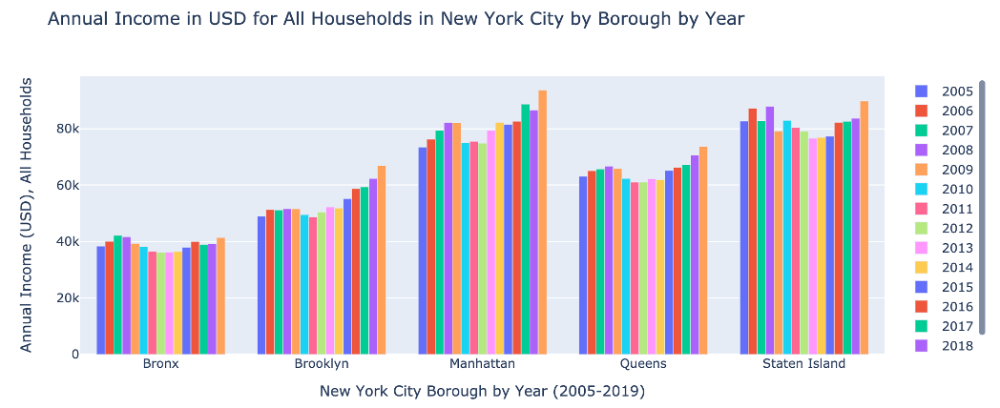

Here, we saw that while incomes had generally risen for New York City residents, incomes had risen more for residents of some boroughs than for residents of other.

### Housing data:

When exploring the base statistics of the housing data when segmented by borough, we saw that the distribution of new housing units varied greatly both with regards to the total number of new projects, as well as with regards to the income levels for which those units were intended. As evidenced by these plots in relation to the one we produced above for the average income levels, we saw that the distribution of the different types of new housing units for each borough corresponded somewhat to the relative rate of increasing incomes in those respective areas.

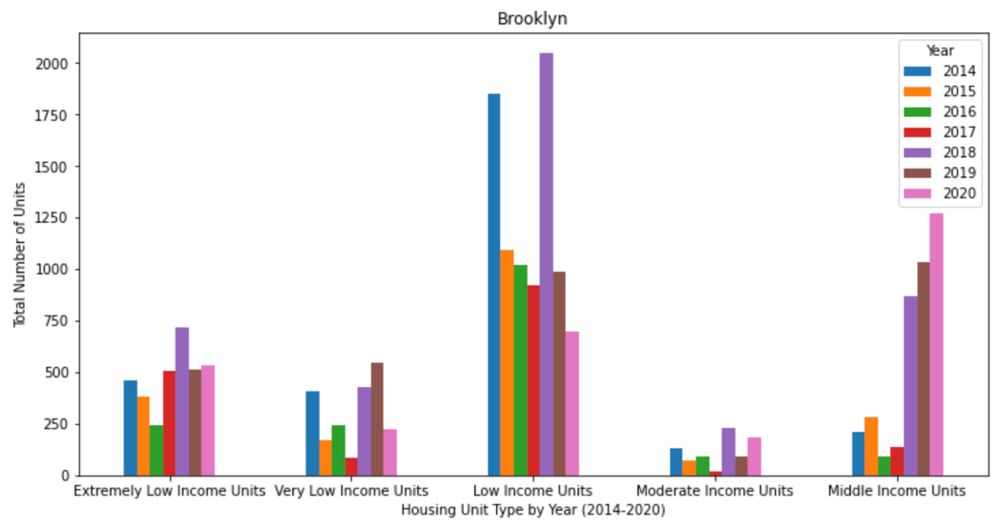

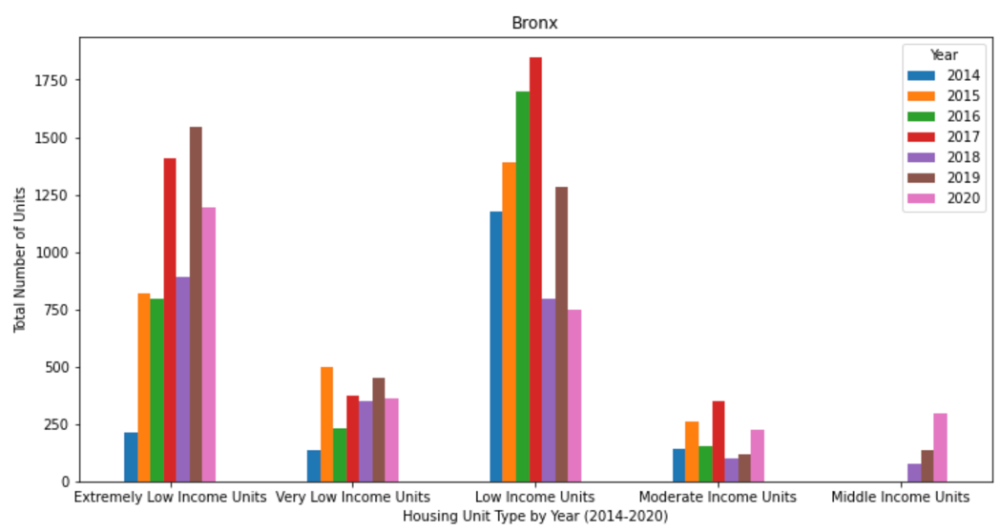

Here, we see that Brooklyn had particularly many new housing units of the middle income variety, while simultaneously being the borough which had seen the largest percentage increase in average income for its residents. Meanwhile, the overall poorest borough, the Bronx, had the largest share of new housing units of the poor and extremely poor varieties.

### Ethnicity data:

Somewhat surprisingly, our initial exploration of the ethnic makeup by New York City borough revealed that the ethnic makeup has remained surprisingly static between 2014 and 2019.

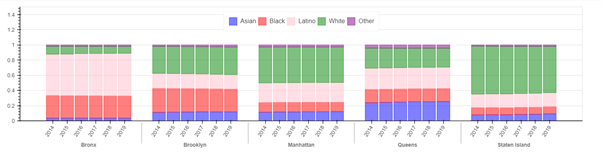

In relating this plot to our overview of the average income by boroughs, it is immediately obvious that the ethnic makeup is strongly correlated with average income levels.

### Crime data:

With regards to the crime data, it is clear that overall crime rates have been consistently dropping across the board for all boroughs.

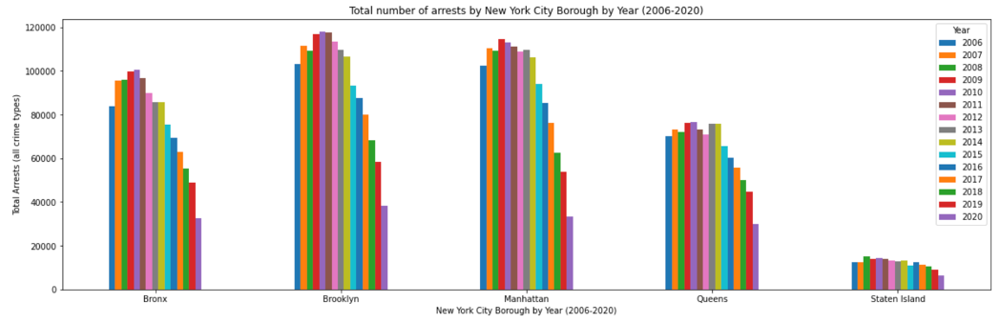

Unfortunately, we cannot say anything about the relative frequency of crime from this chart, since we are plotting the total number of crime incidents, while the five boroughs do not have the same number of total inhabitants.

# 3. Data Analysis

## Our data analysis and what we've learned about the dataset

Our project seeks to investigate the degree to which New York City has undergone gentrification from 2014 to 2019.

In overarching terms, our data analysis has been centered around observing and examining changes to distributions over time, whether that be data on incomes, new housing projects, ethnic makeup, or crime. In so doing, our primarily tools for visualizing the data has been interactive choropleth maps and bar charts.

We worked with income,  housing, demographics/ethnicity and crime data. With the idea of studying gentrification in New York there was several things we needed from each one of them.

The income dataset gave us information on which are considered high and low income boroughs and knowing gentrification happens in those low income ones, we had a first idea on where to focus the sturdy of the following parts.
Housing data gave very relevant information about family income and income units of each borough and neighborhood, allowing a deeper look into how big was the difference between middle income units, and extremely low ones. And how they change borough by borough, year by year.

The next step we took was the analysis of demographics/ethnicity data to see if it could back up a theory of gentrification happening in New York, however we did not find significant movements in the ecthnic percentage of population.
We finally worked with a crime dataset to look for an increase or decrease of crime rates based on the longitude and latitude arrest point. The results we got from this dataset can not give any conclusion on gentrification on their own.

The combination of all results show some gentrification tendencies we can not confirm as the phenomena might involve towns outside of New York we did not analyze.

# 4. Genre

## Which genre of story did we use?

Our website is structured in such a way that it becomes a mix between an author-driven and reader-driven story, in that we force the reader to engage with our text and plots in a specific order, while simultaneously allowing the reader to interact with our plots in the way he or she sees fit. That is, we make use of a linear ordering in combination with elements of free interactivity. 

As such, we believe that our website shares the characteristics of the genre called an **Interactive Slideshow**, which is characterized by the incorporation of interactive elements mid-narrative. Naturally, our website is not explicitly a slideshow, but in practice, readers will have to engage with it in a similar fashion. 

The website employs what is perhaps best described as a **Drill-Down Story** visualization structure, wherein a general theme is presented, for which the reader is able to choose among particular instances of that theme, so as to reveal additional details and backstories.

## Which tools did we use from each of the 3 categories of *visual narrarive*?

To assist and facilitate the narrative, we use a **consistent visual platform** that incorporates a number of highlighting mechanisms such as **feature distinction** and, for our maps, the ability to **zoom**, as well as a few instances of transition guidance, in the form of **animated transitions**. 

Our reason for selecting the **consistent visual platform** for our *Visual Structuring* was its relative simplicity, as we had to be mindful about our time management, given the complexity of building the interactive visualizations we had decided on including. Our interactive maps, however, were natural fits for *Highlighting* via the **feature distinction** and **zooming** methods. The fact that most of our maps revolved around changes to data over time, in turn, made the use of **animated transitions** a natural choice for the category of *Transition Guidance*.


## Which tools did we use from each of the 3 categories of *narrarive structure*?

The type of *Ordering* employed by our narrative is a mix between a **linear** and **user-directed** ordering, as the order in which our visualizations appear is static, whilst simultaneously allowing the reader, on several occasions, to select what categories of data to show and hide. 

These elements of *Interactivity* take on the form of the ability to **filter** between categories and subsets of the various datasets, or to **select** between different representations of the data, using a simple **drop-down menu**. We also allow the user to **navigate** between data representing different years, using a **navigation button** in the form of a **time slider**. Fortunately for us, these interactive elements are simple enough that the intended audience can figure them out from the **initial configuration**, which saves us the trouble of including a tutorial or a set of instructions. The **initial configurations** of the visualizations, in turn, come preloaded with **stimulating default views**, and on many occasions even allow for the display of additional **details** when **hovering** the mouse above the representation of a data point. 

Lastly, we employ an **introductory text**, along with informative **headlines** and **captions**, as well as a brief **summary** at the end, in order to strengthen our *Messaging*.

# 5. Visualization

Among all the possible visual narratives available, we wanted to choose those that would allow the reader to interact with the data presented, being able to zoom or filter to attract and keep their attention. From the seven different types of basic genres of narrative visualization Edward Segel and Jeffrey Heer explain on their papper _’Narrative Visualization: Telling Stories with Data’_ we choose to base our outlined data on animations and interactive graphs the reader can play with. We also chose an interactive slideshow that allows for interaction mid-narrative. This means that if at any point the reader wants to go deeper into a more detailed information they can step forward, interact with the data, make their own conclusions and then keep with the narrative we present for the next point in the story.

Gentrification is very much a geographical problem, thus we heavily relied upon creating interactive maps that change depending on the selected category.

Furthermore, gentrification is not an instantenaous phenomenon, it takes place overtime and in a rather lengthy way. Thus, in order to fully appreciate the gentrification of an area, one needs to observe and its changes over the years. That is why we have capitalised our visualizations to be evolutive throughout the years.

Our main visualizations are:
- Interactive choropleth maps with option to choose granularity, category and time. 
    - Maps seemed a sensible choice as we are dealing with a geographical phenomenon. What's more, choropleth maps allow for an intermediate level of detail and gives an instant idea about the concentration through color intensities. We are dealing with a lot of data and choosing scatter points to map the extremely low income units for a certain year would be very confusing. Furthermore, a choropleth map allows to divide the NYC territory into logical units (districts, neighborhoods, boroughs) that makes sense in the public debate of gentrification (we talk about gentrification of areas and not of single points).
    - By allowing the user to choose granularity, the user can notice changes that can't be observed at a smaller scale: having an average over the whole of NYC masks a lot of information that happens on a district or neighborhood level. However, by still giving the user an option to view the data at a smaller scale (at the scale of a borough for instance), one can appreciate a larger point of view over the changes of the city.
    - By letting the user choose the category, we aim at not overwhelming them. There are many types of households and many types of housing types. We wished to allow the user to pace themselve. Also, 
    - The gentrification phenomenon is only visible throughout time, thus it was essential to have this parameter.
- Interactive line plot:
  - We have added an interactive line plot for the evolution of the different housing types throughout the years for each borough. This is because we want to make evidence of trends: what kind of housing is being built in each borough? what boroughs are loosing their affordable housing? By letting the user choose to plot a line each at a time, they can compare the trends of particular housing types. This allows for greater control and the user not to be overwhelmed. Furthemore, building a line between the plots, even though unprecise due to the low number of years, allows for an instant idea of the evolution of certain housing types.
- Interactive bar plot:
  - One of the objectives of our story was to show the effects of gentrification, not only on an economic point of view but also on a social one. Thus, we wanted to show the effect it can have on minorities. By creating an interactive bar plot, the user is able to explore which ethnicity they wish the vision throughout the years, and at the same time, by overlaying with other ethnicies can compare the evolutions. This allows control and freedom for the user to modulate the amount of information they are provided, and pick the one they are interested in.
- HeatMap with type:
  - A heatmap is a good way to emphasize hotspots. Thus, it seemed judicious to use in order to follow the evolution of certain crimes througout the years over New York in order to study whether there has been a displacement. We were able to see to follow the area where a crime concentrated each year in a seamless way.



## Visualization for the incomes

As stated preivously, here we look at the income throughout the years for each borough.

In [ ]:
# Getting the different borough names
income_by_borough['BoroName'].unique()

years = list(np.arange(2005,2020))

borough_names=list(income_by_borough['BoroName'].sort_values().unique())

bars = []
for year in years:
  bars.append(go.Bar(name=str(year), x=borough_names, y=income_by_borough[income_by_borough['Year']==year].sort_values(by=['BoroName'])['Annual Income (USD), All Households'].values))

fig = go.Figure(data=bars)
# Change the bar mode
fig.update_layout(barmode='group', title='Annual Income in USD for All Households in New York City by Borough by Year',
    xaxis_title='New York City Borough by Year (2005-2019)',
    yaxis_title='Annual Income (USD), All Households',)
fig.show()

## Visualizations of the housing situation in NYC

### First map : number of different types of income units by neighborhood per year

For mapping purposes, we need to append some information to the shapefile in order to use the Choropleth built-in functionality GeoToolTip to add popups when hovering over neighborhoods.

In [ ]:
# Adding data for popups
years = np.arange(2014, 2020, 1)

for f in neighb['features']:
    for htype in format_df['field']:
        Dict = {}
        for year in years:
            # ntacode in json
            ncode = f['properties']['ntacode']
            # keep just for that year
            data = housing_data[housing_data['year'] == year]
            # for that ntacode
            data = data[data['ntacode'] == ncode]
            fieldname = htype+'_'+str(year)
            f['properties'][fieldname] = int(data[htype].values[0])


Finally, we create a method that builds the map of the number of different housing types by neighborhood throughout the time.


In [ ]:
# Html path to save the map (to be able to upload it through dash) -- not used on the notebook
# neighb_map_path = 'housing_map.html'

def create_save_map_neighb(housing_type, year_value):
  # to adjust the colors of the choropleth map, we retrieve the max and min values for the number
  # of these unit types
    min_range = format_df.loc[format_df['verbage']
                              == housing_type, 'min_range'].iloc[0]
    max_range = format_df.loc[format_df['verbage']
                              == housing_type, 'max_range'].iloc[0]
  # we retrieve the name of the field on the dataframe that corresponds to the type of unit chosen
    field_name = format_df.loc[format_df['verbage']
                               == housing_type, 'field'].iloc[0]

  # we limit the data to the year selected
    selected_data = housing_data[housing_data['year'] == year_value]

  # we create the folium map with the cartodpositron type 
    map_NY = folium.Map(
        location=[40.730610, -73.935242], tiles="cartodbpositron", zoom_start=10)

  # we add a background outline for the boroughs
    folium.GeoJson(
        borough,
        style_function=lambda x: {
            'color': 'black',
            'weight': 3,
            'fillOpacity': 0
        },
        name='BoroName').add_to(map_NY)

  # create the choropleth map that displays the number of the type of unit in each neighbordhood
    choro = folium.Choropleth(
        geo_data=neighb,
        data=selected_data[['ntacode', field_name]],
        columns=["ntacode", field_name],
        key_on="feature.properties.ntacode",
        fill_color="PuBu",
        fill_opacity=0.8,
        legend_name='Number of Units').add_to(map_NY)

  # we add a popup when we hover the neighborhood with the neighborhood name, the borough where the neighborhood is and the number of units for the chosen housing type
    folium.LayerControl().add_to(map_NY)
    choro.geojson.add_child(folium.features.GeoJsonTooltip(
        fields=['ntaname', 'boroname', field_name+'_'+str(year_value)], aliases=['Neighborhood', 'Borough', '#'+housing_type]))
    
  # this is used to save the map as html as we load it on dash
    #map_NY.save(neighb_map_path)
  # we return the map instead
    return map_NY

Let's look at an example of what the map looks like when the reader selects "Extremely low income units" of 2015

In [ ]:
# An example of the map
output_notebook()
create_save_map_neighb('Very Low Income Units', 2015)

### Second map : number of different types of income units by borough per year

Another selection option that is proposed to the user is to choose between a map displaying the number of units by neighborhood or by borough.

To create such a map, we follow very similar steps to what is done per borough. To keep the notebook short enough, the steps won't be as explicitly stated that in the first map's explanation as the logic is extremely similar, and one only need to exchange neighborhood with borough.

First we create the dataset, as we start from the one we had created for neighborhoods, we don't need to do more cleaning, just group the data.

In [ ]:
housing_data_borough = housing_data.drop('ntacode', axis=1).groupby(['year', 'borough']).agg({'extremely_low_income': 'sum',
                                                                                              'very_low_income': 'sum',
                                                                                              'low_income': 'sum',
                                                                                              'moderate_income': 'sum',
                                                                                              'middle_income': 'sum'}).reset_index().rename(columns={'borough': 'BoroName'})

We also create a dictionary to facilitate the access to the dataframe

In [ ]:
# A dictionary contains the formatting for the data in the plots
format_data_b = [('extremely_low_income', 0, 2300, 'Extremely Low Income Units'),
                 ('very_low_income', 0, 12000, 'Very Low Income Units'),
                 ('low_income', 0, 6200, 'Low Income Units'),
                 ('moderate_income', 0, 2000, 'Moderate Income Units'),
                 ('middle_income', 0, 5000, 'Middle Income Units')
                 ]

# A DataFrame object from the dictionary
format_df_b = pd.DataFrame(format_data_b, columns=[
    'field', 'min_range', 'max_range', 'verbage'])

We add values to the shapefile to add popups to the map

In [ ]:
for f in borough['features']:
    for htype in format_df['field']:
        for year in years:
            # borough name in json
            bname = f['properties']['BoroName']
            # keep just for that year
            data = housing_data_borough[housing_data_borough['year'] == year]
            # for that borough
            data = data[data['BoroName'] == bname]
            fieldname = htype+'_'+str(year)
            f['properties'][fieldname] = int(data[htype].values[0])

Now we create the method that returns the map. (As before, in the python script for the website, it actually saves the map as html)

In [ ]:
# Html path to save the map (to be able to upload it through dash) -- not used on the notebook
# borough_map_path = 'housing_map_b.html'

def create_save_map_borough(housing_type, year_value):
  # to adjust the colors of the choropleth map, we retrieve the max and min values for the number
  # of these unit types
    min_range = format_df_b.loc[format_df_b['verbage']
                                == housing_type, 'min_range'].iloc[0]
    max_range = format_df_b.loc[format_df_b['verbage']
                                == housing_type, 'max_range'].iloc[0]
  # we retrieve the name of the field on the dataframe that corresponds to the type of unit chosen
    field_name = format_df_b.loc[format_df_b['verbage']
                                 == housing_type, 'field'].iloc[0]

  # we limit the data to the year selected
    selected_data = housing_data_borough[housing_data_borough['year'] == year_value]

  # we create the folium map with the cartodpositron type 
    map_NY = folium.Map(
        location=[40.730610, -73.935242], tiles="cartodbpositron", zoom_start=10)

  # create the choropleth map that displays the number of the type of unit in each borough
    choro = folium.Choropleth(
        geo_data=borough,
        data=selected_data[['BoroName', field_name]],
        columns=["BoroName", field_name],
        key_on="feature.properties.BoroName",
        fill_color="PuBu",
        fill_opacity=0.8,
        legend_name='Number of Units').add_to(map_NY)

  # we add a popup when we hover the neighborhood with the borough name and the number of units for the chosen housing type
    folium.LayerControl().add_to(map_NY)
    choro.geojson.add_child(folium.features.GeoJsonTooltip(
        fields=['BoroName', field_name+'_'+str(year_value)], aliases=['Borough', '#'+housing_type]))

  # this is used to save the map as html as we load it on dash
    #map_NY.save(borough_map_path)
  
  # instead we return the map
    return map_NY

Let's look at an example of what the map looks like when the reader selects "Extremely low income units" of 2015

In [ ]:
create_save_map_borough('Very Low Income Units', 2015)

### Bar plot : number of different types of income units by borough in each year

In parallel to updating the map when the user changes its criteria for year and unit types, we also update a bar plot next to it that shows the repartition of the unit types throughout NYC. This is shown through percentage of the total number of the selected unit time created per borough. It allows the user to have a bigger scale view at the same time, with percentage

**Important note:** in the python script for Dash, we use plotly express as that is faster for updating when the user changes criteria. Creating this as a pandas dataframe is extremely similar to what was done in the first assignment and would require very small changes (using the pandas.bar function).

In [ ]:
# Creating the dataset with the percentage of each unit type per year in each neighborhood
housing_data_borough_perc = housing_data_borough.copy()

for year in years:
    for h in format_df['field'].unique():
        housing_data_borough_perc.loc[housing_data_borough_perc['year'] == year, h] = housing_data_borough_perc[housing_data_borough_perc['year']
                                                                                                                == year][h]/housing_data_borough_perc[housing_data_borough_perc['year'] == year][h].sum()*100


Then we create the method to return the bar plot.

In [ ]:
def update_barplot(housing_type, year_value):
  # we get the field name in the dataframe corresponding to the unit type selected
    field_name = format_df.loc[format_df['verbage']
                               == housing_type, 'field'].iloc[0]

  # we only keep the entries for the year chosen
    units = pd.DataFrame(
        housing_data_borough_perc[housing_data_borough_perc['year'] == year_value])

  # we create the bar plot
    fig = px.bar(units, y='BoroName', x=field_name,
                 hover_data=[field_name], color_discrete_sequence=[
                     "#1D2951"],
                 labels={field_name: '%'+housing_type+' in '+str(year_value), 'BoroName': ''},  orientation='h')

  # and choose a color
    fig.update_layout({'plot_bgcolor': '#f5f5f5'})

  # we return the plot, this is usually captured by dash that displays it
    return fig


Let's look at an example of what the map looks like when the reader selects "Extremely low income units" of 2015

In [ ]:
output_notebook()
update_barplot('Very Low Income Units', 2015)

### Line plot : evolution of different unit types in each borough throughout the years

A good way to see whether a borough has been, or is in the process of becoming, gentrified, is to look at the evolution of the different types of housing units throughout the time in each neighborhood.

This is the idea for this plot: the user can select a neighborhood through the dash select option, and then show the evolution of number of each unit type throughout the year. Through the bokeh functionality, the plot also leaves the choice to the user to display which unit types, which allows not to overwhelm them and the ability to progressively compare.

Here again, we define a function that returns the plot. In the script that is used for the dash website, the figure is saved into html and then uploaded again. Here, an example will be displayed.

In [ ]:
# Html path to save the plot (to be able to upload it through dash) -- not used on the notebook
#line_path = 'line_html'

# Column names in our dataframe
column_names = ['extremely_low_income',	'very_low_income',
                'low_income',	'moderate_income',	'middle_income']

# The colors chosen for the plot
colors = ["#6a2202", "#22180d", "#e5ab09", "#bc7201", "#0f1a26"]

def line_plot(neighborhood):
  # we retrieve the data for the neighborhood chosen by the user
    dataset = housing_data_borough[housing_data_borough['BoroName']
                                   == neighborhood]

  # we set it as a source for the figure
    source = ColumnDataSource(data=dataset)

  # this is used to save the html for dash
    #output_file(line_path)

    plot = figure(title='Number Of Units', x_axis_label='Year',
                  y_axis_label='Units', plot_width=1000, plot_height=450)

    
    # we'll have a line to give visual impression of evolution
    line = {}
    # an points for each actual value we have in the dataframe
    points = {}
    items = []

    # for each year entry for the neighborhood, we create the line and the points and indicate what they look like when selected and unselected.
    for indx, i in enumerate(column_names):
        name = i

        # adding the line for this type of unit
        line[i] = plot.line('year', i, line_width=2, line_color=colors[indx],
                           source=source, muted_alpha=0.01, muted=True, muted_color="lightgrey")
        
        # adding the points for this type of unit
        points[i] = plot.circle('year', i, fill_color=colors[indx], line_color=colors[indx],
                              size=8, source=source,  muted_alpha=0.01, muted=True, muted_color="lightgrey")

        unit_name = format_df.loc[format_df['field'] == i, 'verbage'].iloc[0]
        items.append((unit_name, [line[i], points[i]]))

    # we indicate the localization of the legend
    legend = Legend(items=items, location="top_left")
    plot.add_layout(legend, 'left')
    plot.legend.click_policy = "mute"

  # We do not use this in the notebook as we don't save the html
    #save(plot)

  # Instead we return the plot
    return plot

Let's look at what a plot looks like for the Bronx

In [ ]:
show(line_plot('Bronx'))

### Map plot : location of homeless centers

Here we look at the location of homebase centers through new york

In [ ]:
def create_save_home_map():
    map_NY = folium.Map(
        location=[40.730610, -73.935242], tiles="cartodbpositron", zoom_start=10)

    out = folium.GeoJson(
        neighb,
        style_function=lambda x: {
            'color': 'black',
            'weight': 1,
            'fillOpacity': 0
        },
        name='ntacode').add_to(map_NY)
    for index, row in home.iterrows():
        folium.CircleMarker([row['Latitude'], row['Longitude']],
                            radius=2,
                            fill=True,
                            fill_color='brown',
                            color='brown').add_to(map_NY)

    return map_NY

create_save_home_map()

## Visualization of the income distribution in NYC

Here again, only one example is shown for certain parameters, but the dash website allows for customization.

For the sake of keeping the notebook short, we won't be reexplaining in detail how the code works, as it was already done in the housing part.


### First map : Income of the different type of households by borough in each year

In [ ]:
def income_borough_map(family_type, year_value):
  # we limit the data to the year selected
    selected_data = income_data[income_data['Year'] == year_value]
    selected_data
  # we create the folium map with the cartodpositron type 
    map_NY = folium.Map(
        location=[40.730610, -73.935242], tiles="cartodbpositron", zoom_start=10)
    
  # create the choropleth map that displays the number of the type of unit in each neighbordhood
    choro = folium.Choropleth(
        geo_data=boroughs_geodata,
        data=selected_data[['BoroName', family_type]],
        columns=['BoroName', family_type],
        key_on="feature.properties.BoroName",
        fill_color="Greens",
        fill_opacity=0.8,
        legend_name='Income').add_to(map_NY)

  # we add a popup when we hover the neighborhood with the neighborhood name, the borough where the neighborhood is and the number of units for the chosen housing type
    folium.LayerControl().add_to(map_NY)
    choro.geojson.add_child(folium.features.GeoJsonTooltip(
        fields=['BoroName', family_type+'_'+str(year_value)], aliases=['Borough', 'Income (USD)']))

  # we return the map 
    return map_NY

income_borough_map('All Households', 2015)

### Second map : Income of the different type of households by district in each year

In [ ]:
def income_district_map(family_type, year_value):
    # to adjust the colors of the choropleth map, we retrieve the max and min values for the number
    # of these unit types
    min_range = ranges_house_income.loc[ranges_house_income['family_type']
                                        == family_type, 'min_range'].iloc[0]

    max_range = ranges_house_income.loc[ranges_house_income['family_type']
                                        == family_type, 'max_range'].iloc[0]
    # we limit the data to the year selected
    selected_data = income_data[income_data['Year'] == year_value]
    # we create the folium map with the cartodpositron type
    map_NY = folium.Map(
        location=[40.730610, -73.935242], tiles="cartodbpositron", zoom_start=10)

    # create the choropleth map that displays the number of the type of unit in each neighbordhood
    choro = folium.Choropleth(
        geo_data=districts_geodata,
        data=selected_data[['BoroCD', family_type]],
        columns=['BoroCD', family_type],
        key_on="feature.properties.BoroCD",
        fill_color="Greens",
        fill_opacity=0.8,
        legend_name='Income (USD)').add_to(map_NY)

    # we add a popup when we hover the district with the district name, and the income for that type of household for that year
    folium.LayerControl().add_to(map_NY)
    choro.geojson.add_child(folium.features.GeoJsonTooltip(
        fields=['BoroCD', family_type+'_'+str(year_value)], aliases=['District', 'Income (USD)']))

    return map_NY

income_district_map('All Households', 2015)

## Visualizations of the ethnicity distribution in NYC

For the sake of keeping the notebook short, we won't be reexplaining in detail how the code works, as it was already done in the housing part and the other parts are very similar to what was done in class with the bokeh plot on crimes.

Here again, only one example is shown for certain parameters, but the dash website allows for customization.

### First map : Distribution of ethnicities in the different boroughs of NYC per year

In [ ]:
def ethnicity_borough_map(ethnicity, year_value):
  # we limit the data to the year selected
    selected_data = ethnicity_data[ethnicity_data['Year'] == year_value]

  # we create the folium map with the cartodpositron type
    map_NY = folium.Map(
        location=[40.730610, -73.935242], tiles="cartodbpositron", zoom_start=10)

  # create the choropleth map that displays the number of the type of unit in each neighbordhood
    choro = folium.Choropleth(
        geo_data=boroughs_geodata,
        data=selected_data[['BoroName', ethnicity]],
        columns=['BoroName', ethnicity],
        key_on="feature.properties.BoroName",
        fill_color="Reds",
        fill_opacity=0.8,
        legend_name='Percentage').add_to(map_NY)

  # we add a popup when we hover the neighborhood with the neighborhood name, the borough where the neighborhood is and the number of units for the chosen housing type
    folium.LayerControl().add_to(map_NY)
    choro.geojson.add_child(folium.features.GeoJsonTooltip(
        fields=['BoroName', ethnicity+'_'+str(year_value)], aliases=['Borough', 'Percentage']))

  # this is used to save the map as html as we load it on dash
    #map_NY.save(income_map_path)
    return map_NY


ethnicity_borough_map('White', 2015)

### Second map : Distribution of ethnicities in the different districts of NYC per year

In [ ]:
def ethnicity_district_map(ethnicity, year_value):

    # we limit the data to the year selected
    selected_data = ethnicity_data[ethnicity_data['Year'] == year_value]
    # we create the folium map with the cartodpositron type
    map_NY = folium.Map(
        location=[40.730610, -73.935242], tiles="cartodbpositron", zoom_start=10)

    # create the choropleth map that displays the number of the type of unit in each neighbordhood
    choro = folium.Choropleth(
        geo_data=districts_geodata2,
        data=selected_data[['BoroCD', ethnicity]],
        columns=['BoroCD', ethnicity],
        key_on="feature.properties.BoroCD",
        fill_color="Reds",
        fill_opacity=0.8,
        legend_name='Income (USD)').add_to(map_NY)

    # we add a popup when we hover the neighborhood with the district name, and the percentage of each ethnicity per year in the district
    folium.LayerControl().add_to(map_NY)
    choro.geojson.add_child(folium.features.GeoJsonTooltip(
        fields=['BoroCD', ethnicity+'_'+str(year_value)], aliases=['District', '%'+ethnicity]))

    # this is used to save the map as html as we load it on dash
    return map_NY

ethnicity_district_map('White', 2015)

### Bar plot : Selection of ethnicities in different boroughs 

---

throughout the years

In [ ]:
boroughs = ['Bronx', 'Brooklyn', 'Manhattan', 'Queens', 'Staten Island']

years = [str(i) for i in range(2014, 2020)]

eth_borough = ethnicity_data[ethnicity_data['BoroName'].isin(boroughs)]

factors = [(bor, year) for bor in boroughs for year in years]

ethnicities = ['Asian', 'Black', 'Latino', 'White', 'Other']

colors = ["blue", "red", "pink", "green", "purple"]

def create_unstacked():

    regions = ethnicities

    src = ColumnDataSource(data=dict(
        x=factors,
        Asian=list(eth_borough.sort_values(
            by=['BoroName', 'Year'])['Asian'].values),
        Black=list(eth_borough.sort_values(
            by=['BoroName', 'Year'])['Black'].values),
        Latino=list(eth_borough.sort_values(
            by=['BoroName', 'Year'])['Latino'].values),
        White=list(eth_borough.sort_values(
            by=['BoroName', 'Year'])['White'].values),
        Other=list(eth_borough.sort_values(
            by=['BoroName', 'Year'])['Other'].values)
    ))

    p = figure(x_range=FactorRange(*factors), plot_height=300, plot_width=1200,
               toolbar_location=None, tools="")

    # an points for each actual value we have in the dataframe
    bar = {}
    items = []

    # for each year entry for the neighborhood, we create the line and the points and indicate what they look like when selected and unselected.
    for indx, i in enumerate(ethnicities):
        bar[i] = p.vbar(x='x',  top=i, source=src,  muted_alpha=0.01, muted=True, muted_color="lightgrey", fill_color=colors[indx],
                        fill_alpha=0.7, line_alpha=0, width=0.7)

        items.append((i, [bar[i]]))

    # we indicate the localization of the legend
    legend = Legend(items=items, location="top_left")
    p.add_layout(legend, 'left')

    p.legend.click_policy = "mute"

    return p

show(create_unstacked())

## Visualizations for the crimes evolution in NYC

For the sake of keeping the notebook short, we won't be reexplaining in detail how the code works as it is very similar to the exercise session.

Here again, only one example is shown for certain parameters, but the dash website allows for customization

### Heatmap through time : evolution of the spread of different crimes throughout the years in NYC

In [ ]:
def create_heatmap(crime):
    selected = crime_data[crime_data['OFNS_DESC'] == crime]
    selected = selected[['Latitude', 'Longitude', 'ARREST_DATE']]

    selected['ARREST_DATE'] = selected['ARREST_DATE'].astype(str)
    selected['Weight'] = selected['ARREST_DATE'].str[0:4]

    selected['Weight'] = selected['Weight'].astype(float)
    selected['Latitude'] = selected['Latitude'].astype(float)
    selected['Longitude'] = selected['Longitude'].astype(float)

    selected = selected.drop(columns=['ARREST_DATE'])

    heat_data = [[[row['Latitude'], row['Longitude']] for index,
                  row in selected[selected['Weight'] == i].iterrows()] for i in range(2014, 2021)]

    h_map = folium.Map(location=[40.730610, -73.935242],
                       tiles="cartodbpositron", zoom_start=10)
    hm = plugins.HeatMapWithTime(
        heat_data, auto_play=True, max_opacity=0.6, index=list(np.arange(2014, 2021)))
    hm.add_to(h_map)

    return h_map


create_heatmap('ASSAULT 3 & RELATED OFFENSES')

# 6. Discussion

## What went well?

In our estimation, our greatest achievement is that we succeeded in realising our technical goals with regards to our visualizations and hosting them on the website. 

The visualizations we wanted to create posed a great technical challenge due in part to the degree of interactivity we wanted to incorporate, but also due to the density of information that we wanted to put on display (for example, a bar chart that displays individual ethnic groups as a percent of all groups by borough by year, with the option of interactively selecting which ethnic groups to show or hide).

## What is still missing? What could be improved? Why?

Given more time, we would have liked to be able to add in data on rent levels and poverty rates, as the addition of such information would have greatly complemented our existing datasets, and likely would have strengthened our conclusions. Unfortunately, we first came across some high-quality datasets covering these topics as we were already well underway with our project, and for time management reasons, we (wisely) decided not to incorporate these into our analysis. 

Although the datasets we ended up using came from very reliable sources and were fairly complete, it would have greatly strengthened the quality of our analysis had we been able to cover a greater interval of overlapping years across all datasets. Given more time, it is possible that we could have managed to locate more extensive datasets on the subjects included in the analysis.

We originally intended to add a machine learning component to our project, but because of the many relevant datasets we included in the analysis, and because we could not spot an obvious use-case in the context of our project, we ultimately did not include any predictive analytics component in this project.

With regards to the quality of our website’s narrative, we believe that its main shortcoming is in our not having included enough variables to be fully confident in our conclusion. Other interesting variables that we considered, but did not have enough time to add to the analysis, includes developments in rent levels, as well as poverty levels.

# 7. Contributions

Everyone made contributions to all parts of the project (code snippets as well as written analyses), but key responsibilities were distributed as follows: 

Mads: 
-	Income and ethnicity data and visualizations.
-	Explainer notebook text.

Miriam: 
-	Crime data and visualizations.
-	Narrative for website.

Zineb: 
-	Housing and homeless center data and visualizations. 
-	Dash integrations, website hosting, and refinement of visualizations.
- Explainer notebook.